In [1]:
import os
import pickle
import sys
from collections import defaultdict
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import pandas as pd
from skimage import measure, exposure
import skimage
from tqdm.notebook import trange, tqdm, tqdm_notebook
import numpy as np

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# Import path
module_path = str(Path.cwd().parents[0])
if module_path not in sys.path:
    sys.path.append(module_path)

from config import *

In [4]:
# Create directory if not existL
try:
    data_mask.mkdir(parents=True, exist_ok=False)
except FileExistsError:
    print("Image Mask folder is already there")
else:
    print("Image Mask folder was created")

info_csv = data_meta / "info_combined.csv"

Image Mask folder is already there


In [5]:
module_path = str(Path.cwd().parents[0] / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as my_utils

# Read image and convert to rgb for segmentation

In [9]:
# Read dataframe containing images information
df = pd.read_csv(info_csv)
df = df[df.After_bleach == False]
df = df[df.Location == 1]

In [10]:
from skimage.morphology import disk
from skimage.filters.rank import enhance_contrast, mean_bilateral
from scipy import ndimage
from skimage.restoration import denoise_nl_means, estimate_sigma
import cv2 
from joblib import Parallel, delayed

DEFAULT_CHANNELS = (1, 2)

RGB_MAP = {
    1: {"rgb": np.array([255, 0, 0]), "range": [0, 120]},
    # 2: {"rgb": np.array([0, 255, 0]), "range": [0, 20]},
    2: {"rgb": np.array([0, 0, 255]), "range": [0, 100]},
}

def contrast_streching(img):
    p2, p98 = np.percentile(img, (1, 99))
    img = exposure.rescale_intensity(img, in_range=(p2, p98))
    return img

def read_img(path):
    img = contrast_streching(skimage.io.imread(path))[:, :, np.newaxis]
    img = cv2.GaussianBlur(img, (15,15), 0)[:, :, np.newaxis]
    return img

def joblib_loop(task, pics):
    return Parallel(n_jobs=20)(delayed(task)(i) for i in pics)

def get_composite_image(df, seg_cycle="Cycle1"):
    # Read condition and cycles name
    
    imgs = []

    df_grouped = df.groupby(['Location'])
    locations = []
    markers = ['p-EGFR', 'Concanavalin A', 'B-actin', 'WGA', 'APC', 'Wnt1']
    for name, df_subset in tqdm(df_grouped):
        dapi_path = df_subset[df_subset.Marker == "Hoeschst"].iloc[0,:].Path
        img_dapi = contrast_streching(skimage.io.imread(dapi_path))

        paths = df_subset[df_subset.Marker.isin(markers)].Path.tolist()
        imgs_channel = joblib_loop(read_img, paths)
        
#         for marker in markers:
#             path = df_subset[df_subset.Marker == marker].iloc[0,:].Path
#             img = contrast_streching(skimage.io.imread(path))[:, :, np.newaxis]
#             img = cv2.GaussianBlur(img, (15,15), 0)[:, :, np.newaxis]
#             imgs_channel.append(img)

        img_seg = np.concatenate(imgs_channel, axis=2)
        seg_max = np.clip(np.sum(img_seg, axis=2, keepdims=True), a_max=32768, a_min=0).astype(np.uint16)
        seg_max = cv2.GaussianBlur(seg_max, (21,21), 0)
        seg_max = ndimage.median_filter(seg_max, 21)[:,:,np.newaxis]

        data = np.concatenate(
            (
                seg_max,
                img_dapi[:, :, np.newaxis]
            ),
            axis=2,
        )
        img = my_utils.convert_to_rgb(data, channels=DEFAULT_CHANNELS, rgb_map=RGB_MAP, vmax=65536)
        imgs.append(img)
        locations.append(name)
        
#         plt.figure(figsize=(10, 10))
#         plt.axis("off")
#         plt.imshow(img)
#         plt.show()
    return imgs, locations

In [11]:
imgs, locations = get_composite_image(df)

  0%|          | 0/1 [00:00<?, ?it/s]

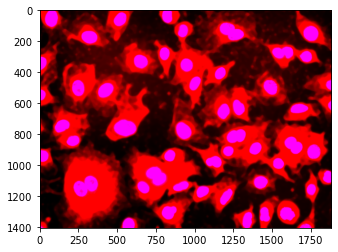

In [14]:
plt.imshow(imgs[0])

# Segmentation with cellpose

In [17]:
def save_mask(masks, locations, folder):
    for idx in range(len(masks)):
        filename = "_".join([str(locations[idx]), "cyto_masks"])
        path = os.path.join(folder, filename + ".tif")
        skimage.io.imsave(path, masks[idx])

In [2]:
from cellpose import models, plot, utils

use_GPU = models.use_gpu()
print(">>> GPU activated? %d" % use_GPU)


# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type="cyto")

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
channels = [1, 3]

masks, flows, styles, diams = model.eval(
    imgs, diameter=200, cellprob_threshold=-0.5, flow_threshold=0.5, channels=channels, resample=True, batch_size=128
)

2021-08-26 15:02:13,810 [INFO] WRITING LOG OUTPUT TO C:\Users\thu71\.cellpose\run.log
2021-08-26 15:02:17,925 [INFO] ** TORCH CUDA version installed and working. **
>>> GPU activated? 1
2021-08-26 15:02:17,928 [INFO] ** TORCH CUDA version installed and working. **
2021-08-26 15:02:17,930 [INFO] >>>> using GPU


NameError: name 'imgs' is not defined

In [14]:
nimg = len(imgs)
for idx in range(nimg):

    fig, ax = plt.subplots(1,2,figsize=(20, 10))
    ax[0].imshow(imgs[idx])
    ax[1].imshow(masks[idx], interpolation="None", cmap='jet')
    ax[0].axis('off')
    ax[1].axis('off')
    fig.subplots_adjust(wspace=0.01)
    plt.savefig(figure_dir / 'segmentation' / f'{idx+1}.png', bbox_inches='tight')
    plt.close(fig)


In [15]:
save_mask(masks, locations, data_mask)

<ipython-input-11-ae50e450ffae>:5: UserWarning: Y:\coskun-lab\Thomas\Spatial signaling\dataset 4\data\mask\1_cyto_masks.tif is a low contrast image
  skimage.io.imsave(path, masks[idx])
<ipython-input-11-ae50e450ffae>:5: UserWarning: Y:\coskun-lab\Thomas\Spatial signaling\dataset 4\data\mask\2_cyto_masks.tif is a low contrast image
  skimage.io.imsave(path, masks[idx])
<ipython-input-11-ae50e450ffae>:5: UserWarning: Y:\coskun-lab\Thomas\Spatial signaling\dataset 4\data\mask\3_cyto_masks.tif is a low contrast image
  skimage.io.imsave(path, masks[idx])
<ipython-input-11-ae50e450ffae>:5: UserWarning: Y:\coskun-lab\Thomas\Spatial signaling\dataset 4\data\mask\4_cyto_masks.tif is a low contrast image
  skimage.io.imsave(path, masks[idx])
<ipython-input-11-ae50e450ffae>:5: UserWarning: Y:\coskun-lab\Thomas\Spatial signaling\dataset 4\data\mask\5_cyto_masks.tif is a low contrast image
  skimage.io.imsave(path, masks[idx])
<ipython-input-11-ae50e450ffae>:5: UserWarning: Y:\coskun-lab\Thomas\S

## Nuclei channel segmentation

In [16]:
def save_mask_nuclei(masks, locations, folder):
    for idx in range(len(masks)):
        filename = "_".join([str(locations[idx]), "nuclei_masks"])
        path = os.path.join(folder, filename + ".tif")
        cv2.imwrite(path, masks[idx])
        

In [17]:
imgs_nuclei = [img[:, :, 2] for img in imgs]

In [18]:
# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type="nuclei")

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
channels = [0, 0]

masks_nuclei, flows, styles, diams = model.eval(
    imgs_nuclei, diameter=80, flow_threshold=None, channels=channels, resample=True
)

In [19]:
nimg = len(imgs_nuclei)
for idx in range(nimg):

    fig, ax = plt.subplots(1,2,figsize=(20, 10))
    ax[0].imshow(imgs[idx][:, :, 2], cmap='gray')
    ax[1].imshow(masks_nuclei[idx], interpolation="None", cmap='jet')
    ax[0].axis('off')
    ax[1].axis('off')
    fig.subplots_adjust(wspace=0.01)
    plt.savefig(figure_dir / 'segmentation' / f'{idx+1}_nuclei.png', bbox_inches='tight')
    plt.close(fig)


In [20]:
save_mask_nuclei(masks_nuclei, locations, data_mask)

# Create contour 

In [21]:
masks = my_utils.get_masks(data_mask)

In [22]:
# Get contour of masks
contours_all = defaultdict(dict)
contours_nuclei_all = defaultdict(dict)
for loc, mask in tqdm(masks.items()):
    mask, mask_nuclei, _ = my_utils.qc_nuclei(mask["cyto"], mask["nuclei"])
    contours_all[loc] = my_utils.get_contour(mask)
    contours_nuclei_all[loc] = my_utils.get_contour(mask_nuclei)

  0%|          | 0/63 [00:00<?, ?it/s]

In [23]:
# Save contours to pickle
my_utils.save_pickle(data_meta / "contours.pickle", [contours_all, contours_nuclei_all])

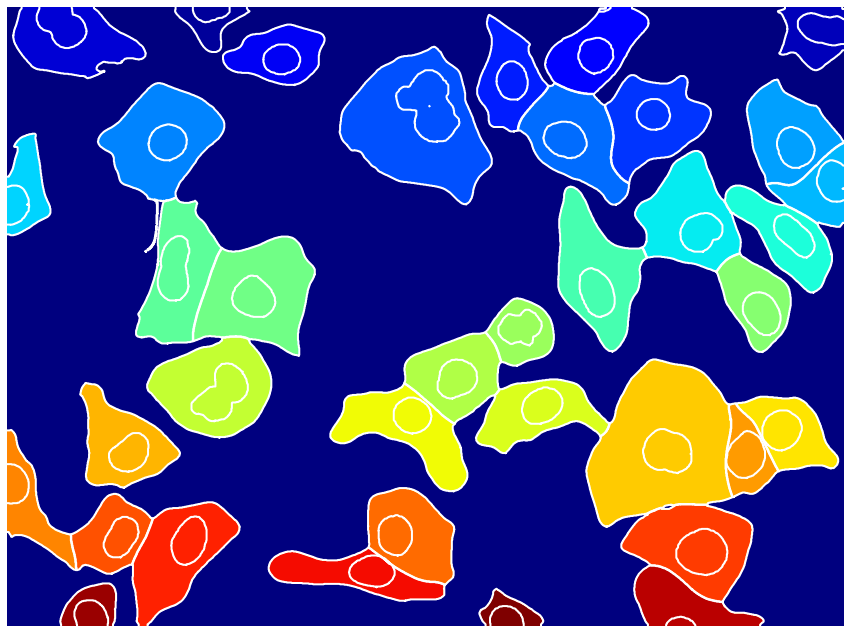

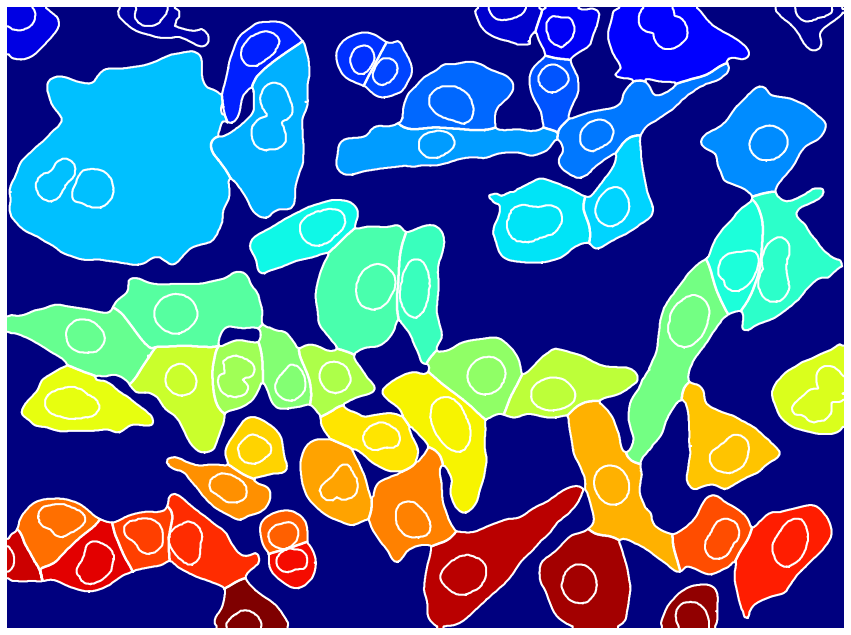

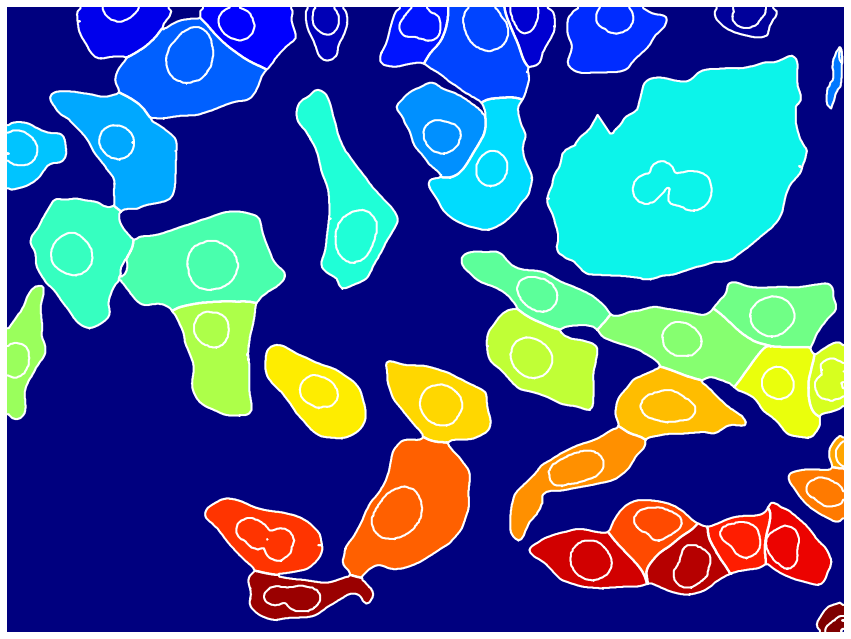

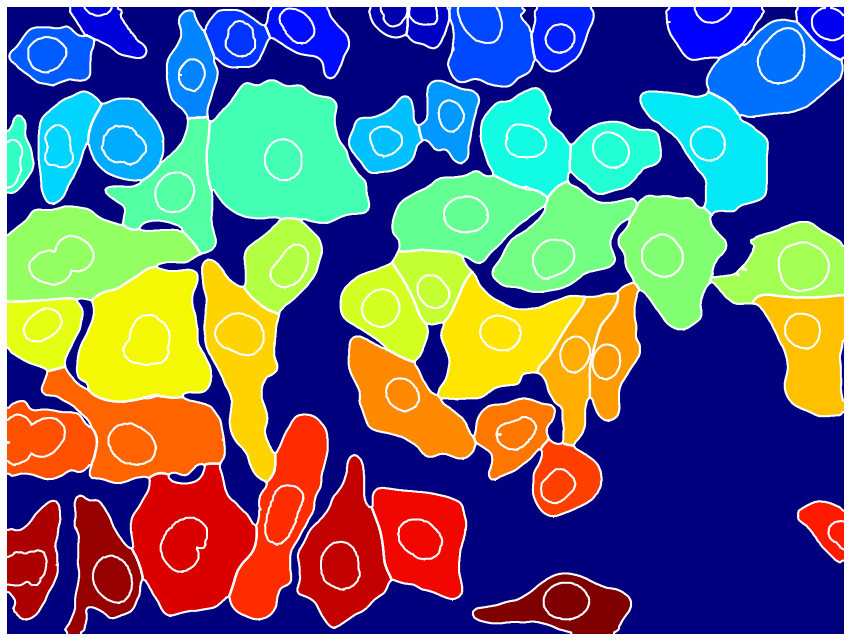

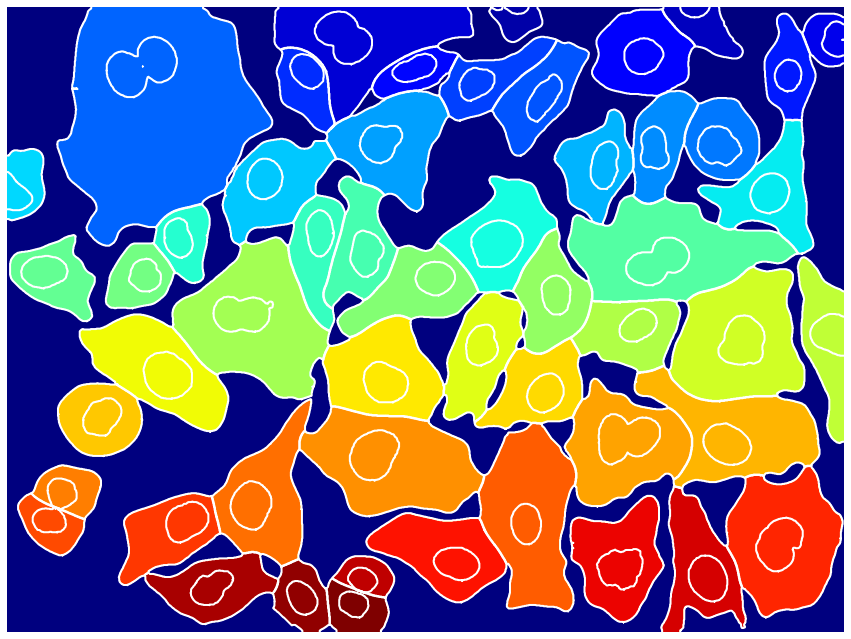

...

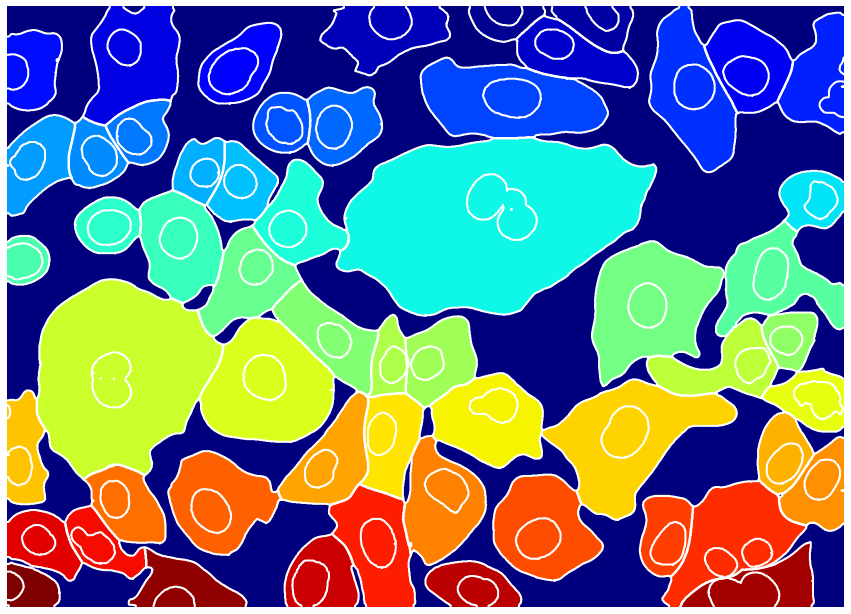

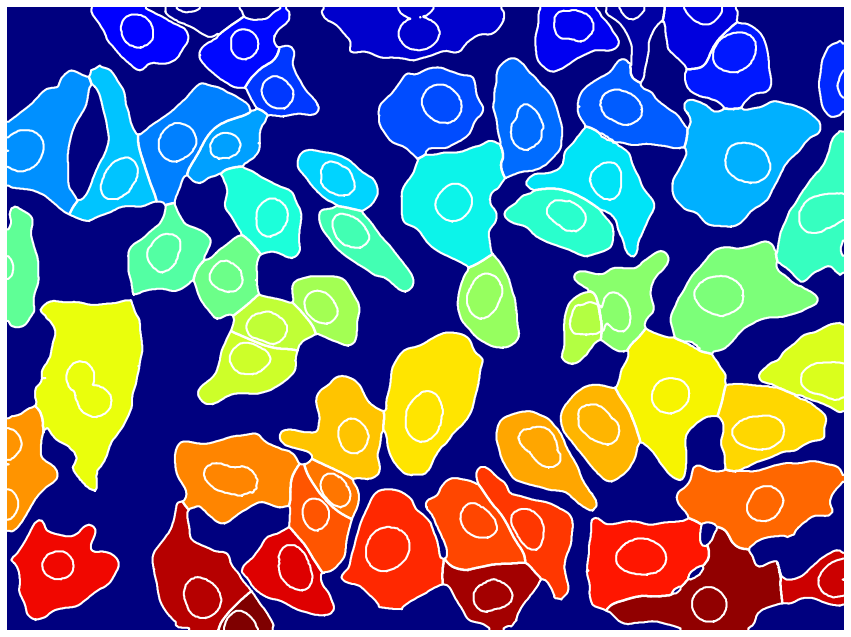

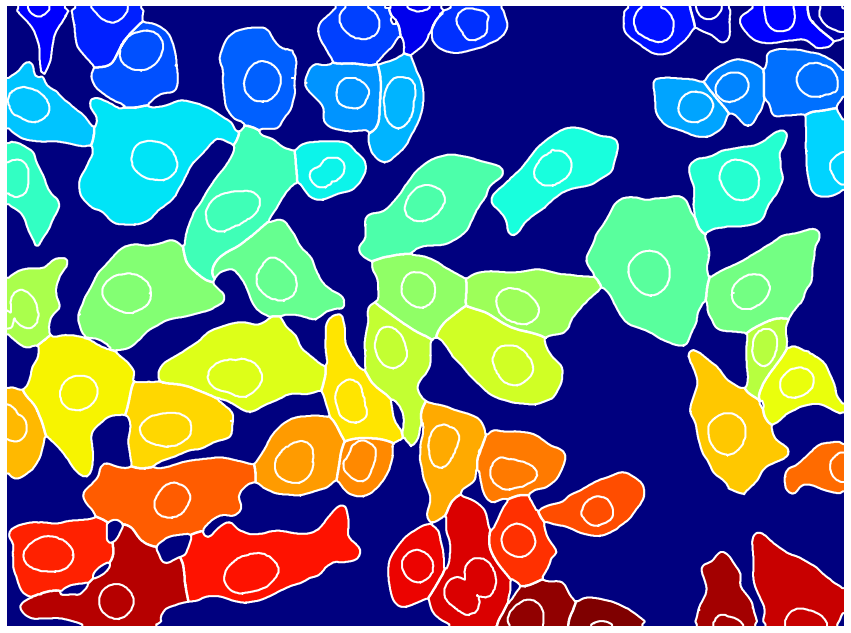

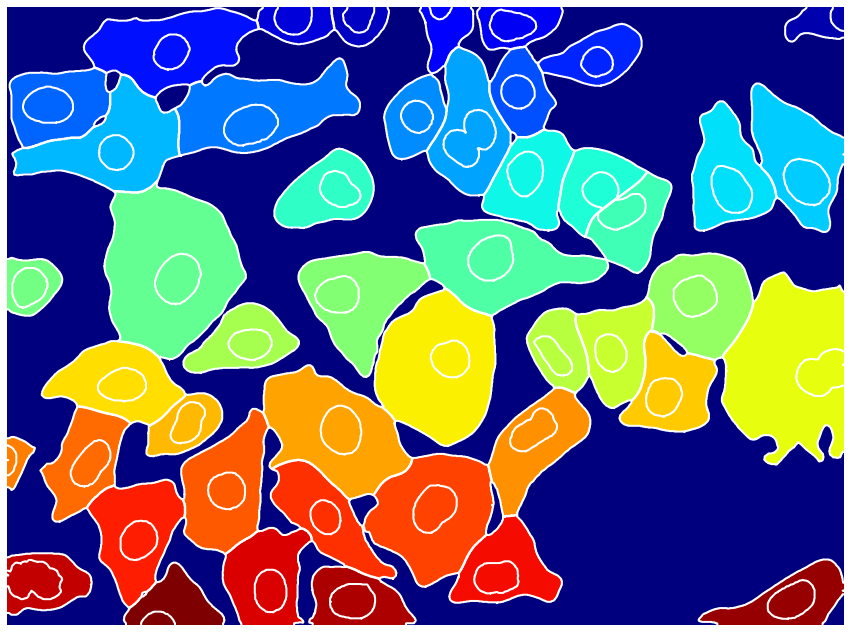

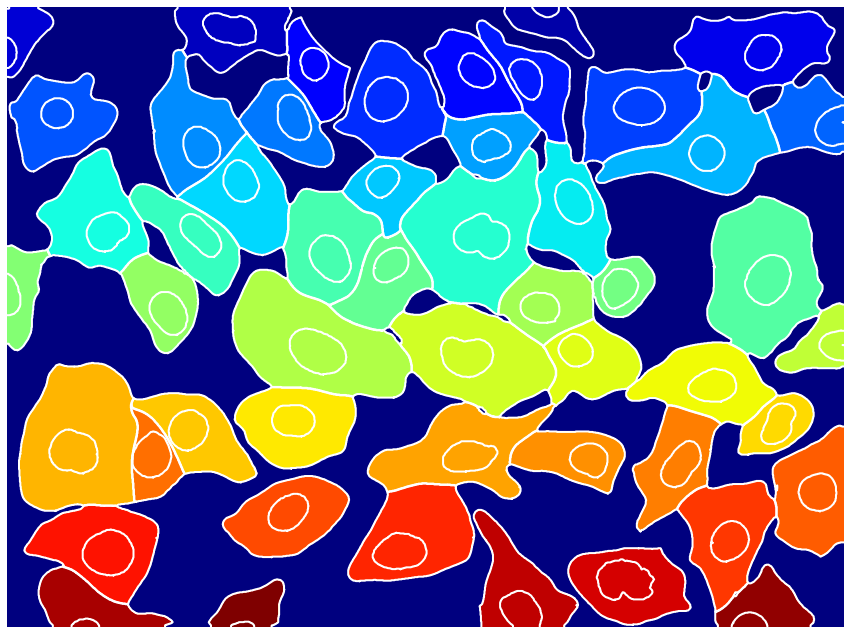

In [24]:
for loc, mask in masks.items():
    mask, mask_nuclei, _ = my_utils.qc_nuclei(mask["cyto"], mask["nuclei"])

    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(mask, cmap="jet")
    ax.axis("off")

    contours = contours_all[loc]
    contours_nuclei = contours_nuclei_all[loc]

    my_utils.plot_contours(contours, ax)
    my_utils.plot_contours(contours_nuclei, ax)
    plt.show()